<a href="https://colab.research.google.com/github/Vishagan-hub/Component-failure-analysis-and-prediction/blob/main/Analysis%20and%20prediction%20models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import time
from collections import Counter
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#importing required sklearn packages
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.preprocessing import MinMaxScaler,RobustScaler,StandardScaler
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, accuracy_score, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#to handle imbalance in dataset
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [2]:
df=pd.read_csv("/content/Component Failure prediction/component_failure_prediction.csv")

In [3]:
df.head(3)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB


In [5]:
df.drop(columns=['UDI','Product ID'],axis=1,inplace=True)

In [6]:
df.describe()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900
std,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981
min,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000
25%,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000
50%,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000
75%,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000
max,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000


In [7]:
df.describe(include=['object'])

,Type,Failure Type
count,10000,10000
unique,3,6
top,L,No Failure
freq,6000,9652


In [8]:
pd.DataFrame(
{
    "Count":df['Type'].value_counts()
})

,Count
L,6000
M,2997
H,1003


In [9]:
pd.DataFrame({"Count":df['Target'].value_counts()})

,Count
0,9661
1,339


In [10]:
pd.DataFrame(
{
    "Count":df['Failure Type'].value_counts()
})

,Count
No Failure,9652
Heat Dissipation Failure,112
Power Failure,95
Overstrain Failure,78
Tool Wear Failure,45
Random Failures,18


the non failure count in target and failure type column seems to be contradicting eachother

In [11]:
df[(df['Target']==0) & (df['Failure Type'] != "No Failure")]['Failure Type'].value_counts()

Random Failures    18
Name: Failure Type, dtype: int64

there are 18 components that are recorded as non-failure in target column and random failures in failure type column instead of no failure

In [12]:
df[(df['Target']==1) & (df['Failure Type'] == "No Failure")]['Failure Type'].value_counts()

No Failure    9
Name: Failure Type, dtype: int64

similarly there are 9 components that are recorded as failure in target column and no failures in failure type column

In [13]:
df.drop(df[(df['Target']==1) & (df['Failure Type'] == "No Failure")].index,axis=0,inplace=True)
df.drop(df[(df['Target']==0) & (df['Failure Type'] != "No Failure")].index,axis=0,inplace=True)

droping those 27 records as it can lead to false prediction

In [14]:
pd.DataFrame({"Count":df['Target'].value_counts()})

,Count
0,9643
1,330


In [15]:
pd.DataFrame(
{
    "Count":df['Failure Type'].value_counts()
})

,Count
No Failure,9643
Heat Dissipation Failure,112
Power Failure,95
Overstrain Failure,78
Tool Wear Failure,45


In [16]:
df.shape

(9973, 8)

In [17]:
df.describe()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
count,9973.000000,9973.000000,9973.000000,9973.000000,9973.000000,9973.000000
mean,300.003259,310.004031,1538.893212,39.978993,107.921087,0.033089
std,2.000548,1.483692,179.412171,9.966805,63.649152,0.178879
min,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000
25%,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000
50%,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000
75%,301.500000,311.100000,1612.000000,46.700000,162.000000,0.000000
max,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000


# EDA

## Univariant analysis

In [18]:
def countplot(column: pd.Series,title: str):
    sns.countplot(x=column)
    plt.title(title)
    plt.tight_layout()
    plt.show()

def box_and_kde_plot(column: pd.Series,title: str):
    fig,ax=plt.subplots(2,1,figsize=(10,7),dpi=100)
    sns.boxplot(x=column,ax=ax[0])
    sns.kdeplot(column,ax=ax[1],shade=True)
    ax[0].set_title(title)
    plt.tight_layout()
    plt.show()

def calc(pct, allvals):
    total = sum(allvals)
    absolute = int(pct / 100. * total)  # Calculate absolute value
    return f"{pct:.2f}%\n{absolute:d}"+" components" # Display both percentage and total

def pieplot(size,labels,explode,title,figsize=(5,5)):
    plt.figure(figsize=figsize,dpi=100)
    plt.pie(size,
        autopct=lambda x:calc(x,size),
        labels=labels,
        explode=explode,
        shadow=True)
    plt.axis('equal')
    plt.title(title)
    plt.show()

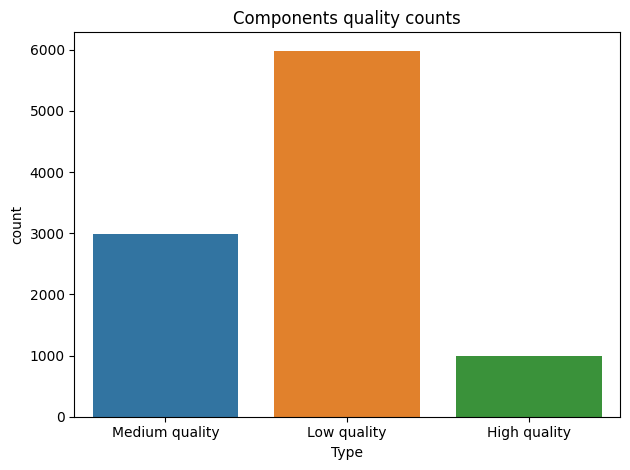

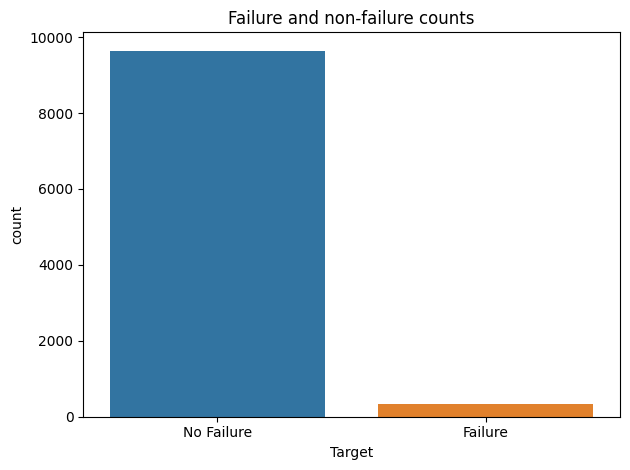

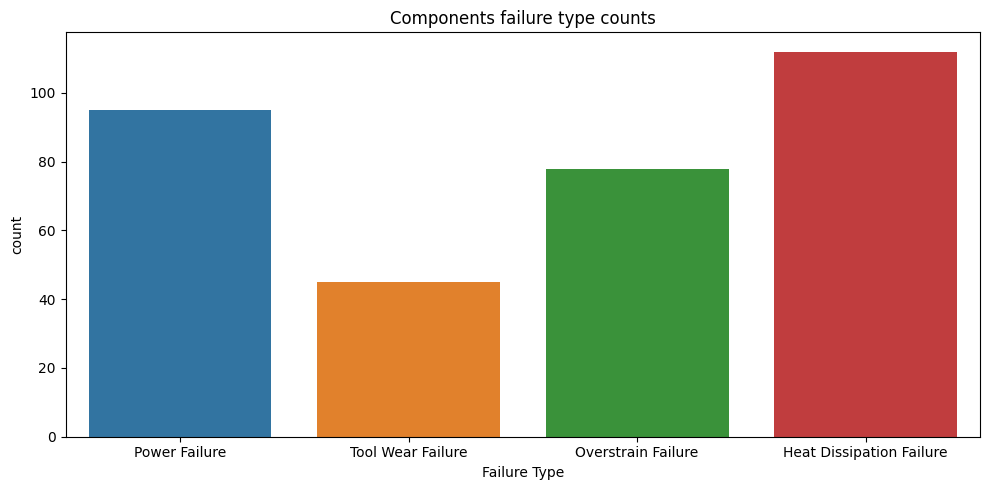

In [19]:
countplot(df['Type'].map({'M':'Medium quality','L':'Low quality','H':'High quality'}),title="Components quality counts")
print()
countplot(df['Target'].map({0:'No Failure',1:'Failure'}),title="Failure and non-failure counts")
print()
plt.figure(figsize=(10,5))
#countplot(df['Failure Type'],)
countplot(df[df['Failure Type']!='No Failure']['Failure Type'],title="Components failure type counts")

The above plot shows that although the company manufactures low quality products more, yet the components failure seems to be low. In other words, the dataset is imbalance we have less record of failed components this can lead to feeding less information to our prediction model which will affect our component failure prediction accuracy, so it is required to handle the imbalance in the dataset by performing over sampling of failed components and under sampling of non-failed components.

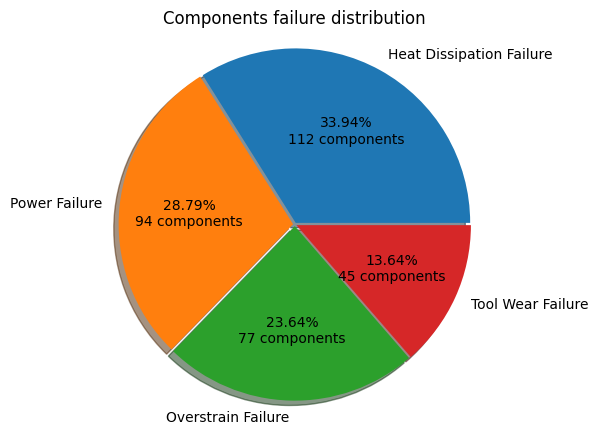

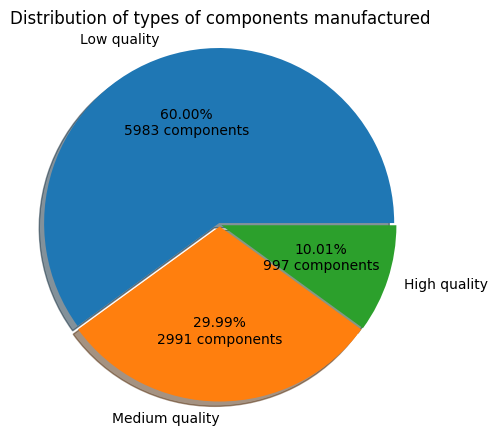

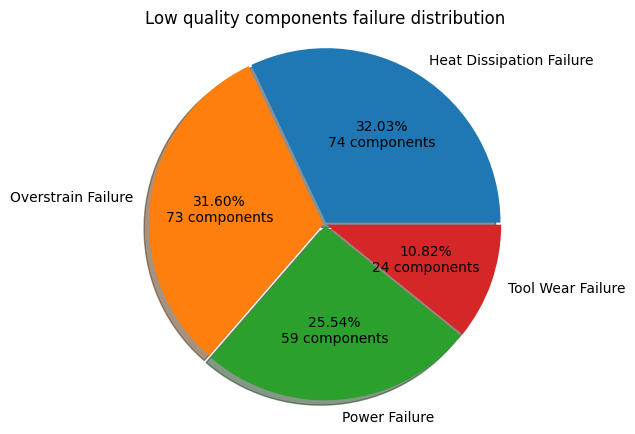

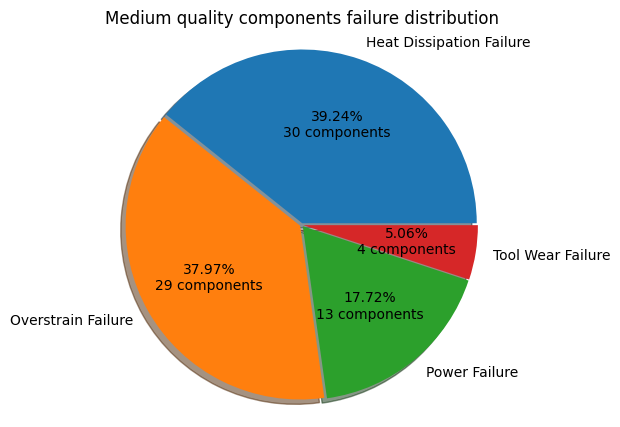

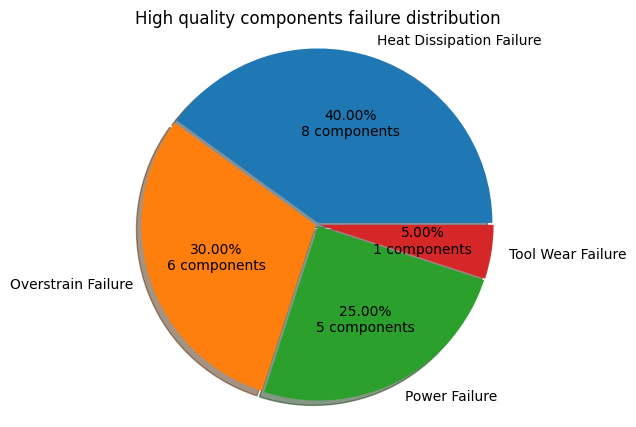

In [20]:
size=df[df['Failure Type'] != "No Failure"]["Failure Type"].value_counts()
labels=['Heat Dissipation Failure','Power Failure','Overstrain Failure','Tool Wear Failure']
explode=(.01,.01,.01,.01)
title="Components failure distribution"

pieplot(size,labels,explode,title)
print()

size=df['Type'].value_counts()
labels=['Low quality','Medium quality','High quality']
explode=(.01,.01,.01)
title="Distribution of types of components manufactured"

pieplot(size,labels,explode,title)
print()

types=[("L",'Low quality'),('M','Medium quality'),('H','High quality')]
for i,j in types:
    size=df[(df['Type']==i) & (df['Failure Type'] != "No Failure")]["Failure Type"].value_counts()
    labels=['Heat Dissipation Failure','Overstrain Failure','Power Failure','Tool Wear Failure']
    explode=(.01,.01,.01,.01)
    title=j + " components failure distribution"

    pieplot(size,labels,explode,title)
    print()

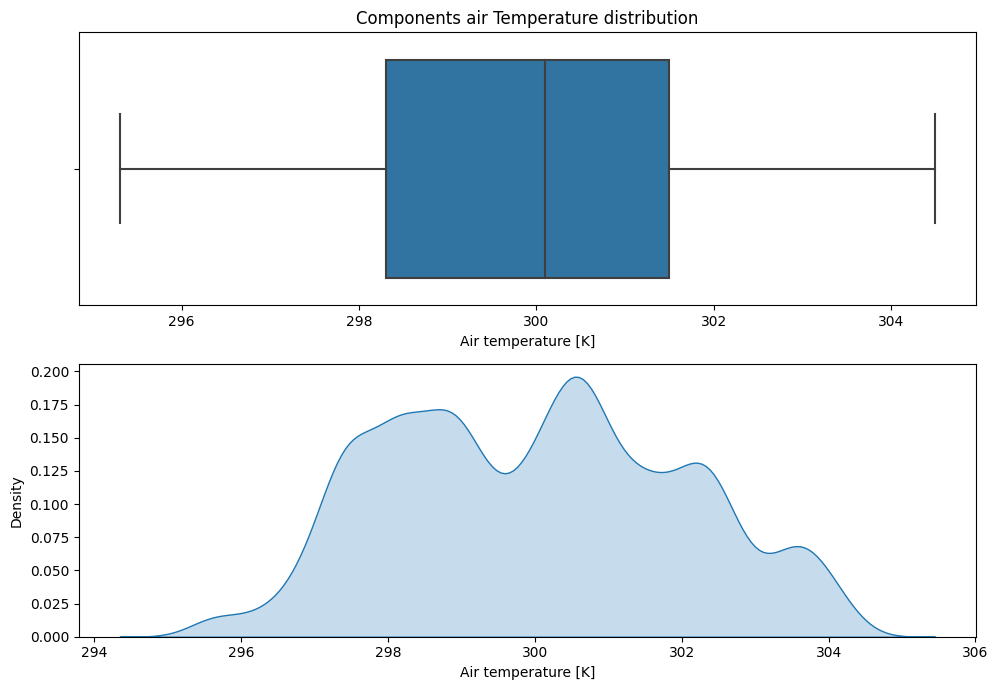

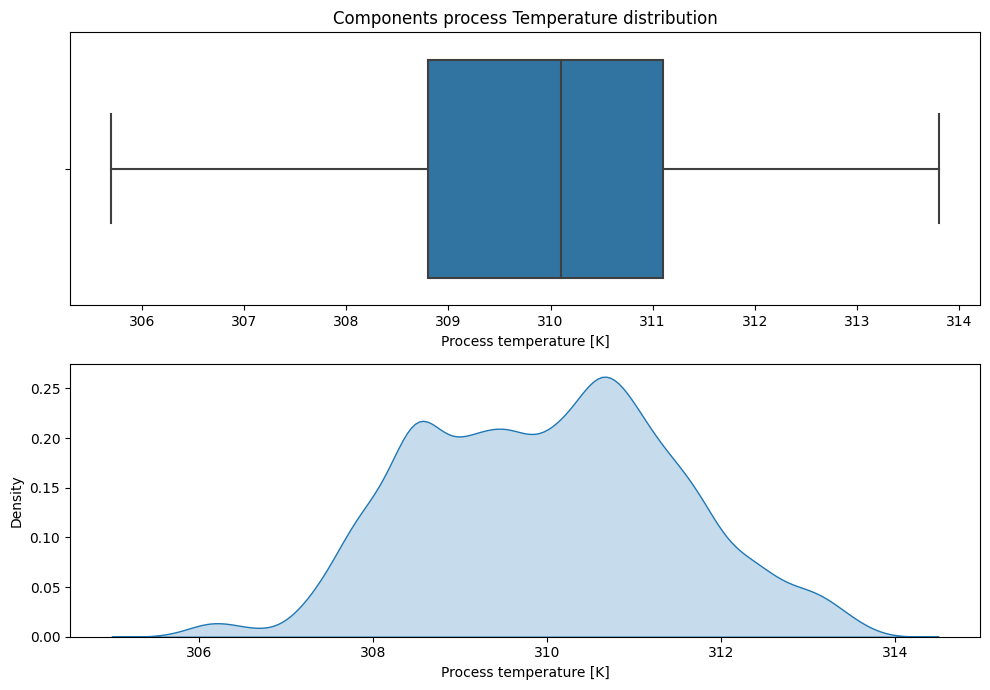

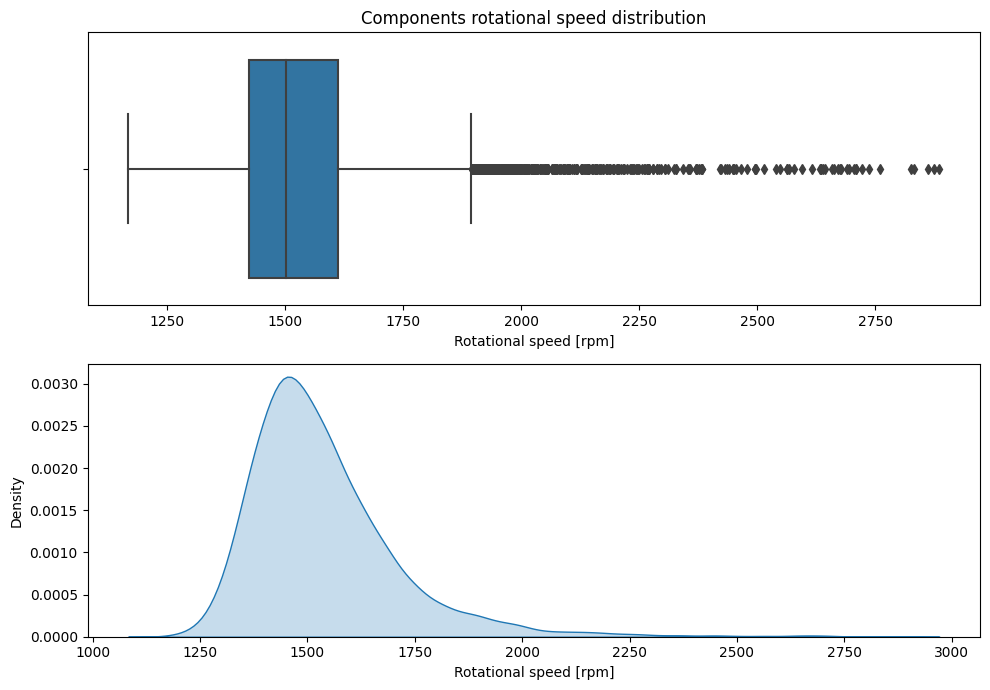

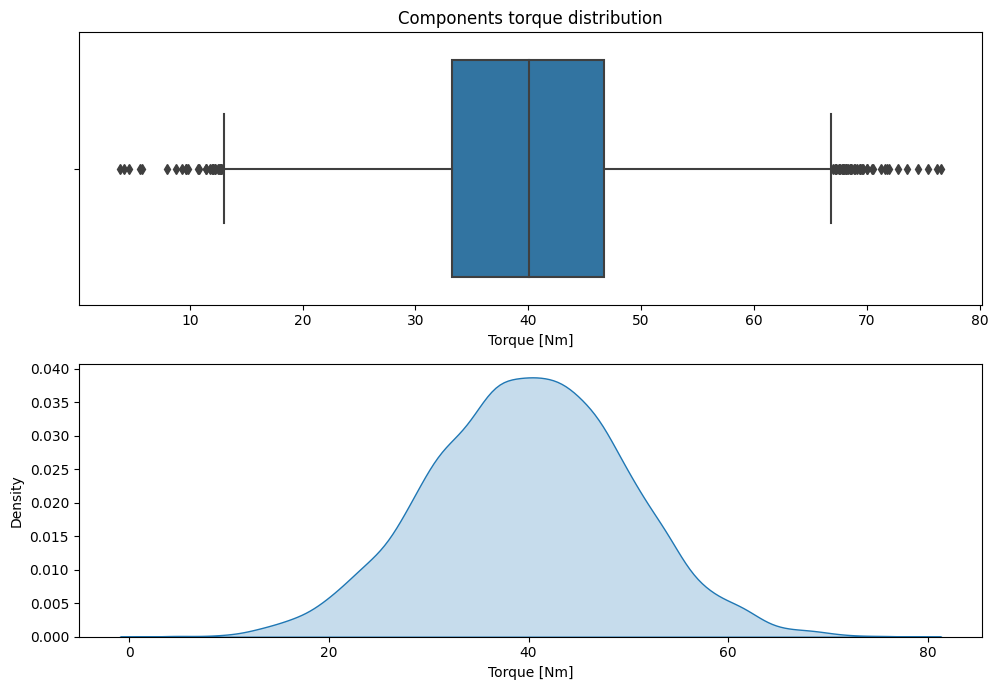

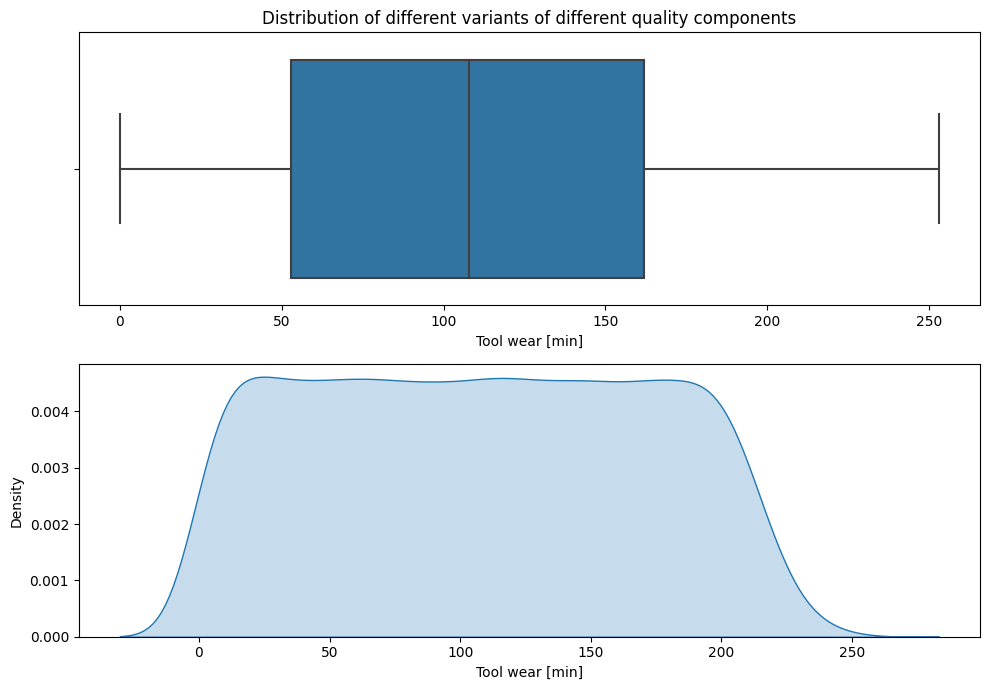

In [21]:
box_and_kde_plot(df['Air temperature [K]'],title="Components air Temperature distribution")
print()
box_and_kde_plot(df['Process temperature [K]'],title="Components process Temperature distribution")
print()
box_and_kde_plot(df['Rotational speed [rpm]'],title="Components rotational speed distribution")
print()
box_and_kde_plot(df['Torque [Nm]'],title="Components torque distribution")
print()
box_and_kde_plot(df['Tool wear [min]'],title="Distribution of different variants of different quality components")

In [22]:
df['Rotational speed [rpm]'].skew()

1.9928590857868387

In [23]:
df['Torque [Nm]'].skew()

-0.009719368019357482

We could notice that outliers occurs in rotational speed and torque columns and only those two columns are normaly distributed. Although rotational speed column is right skewed.

Since only non-failure components dominate our records there might be a possibility that these outliers are the records of failed components

 ## Bivariant analysis

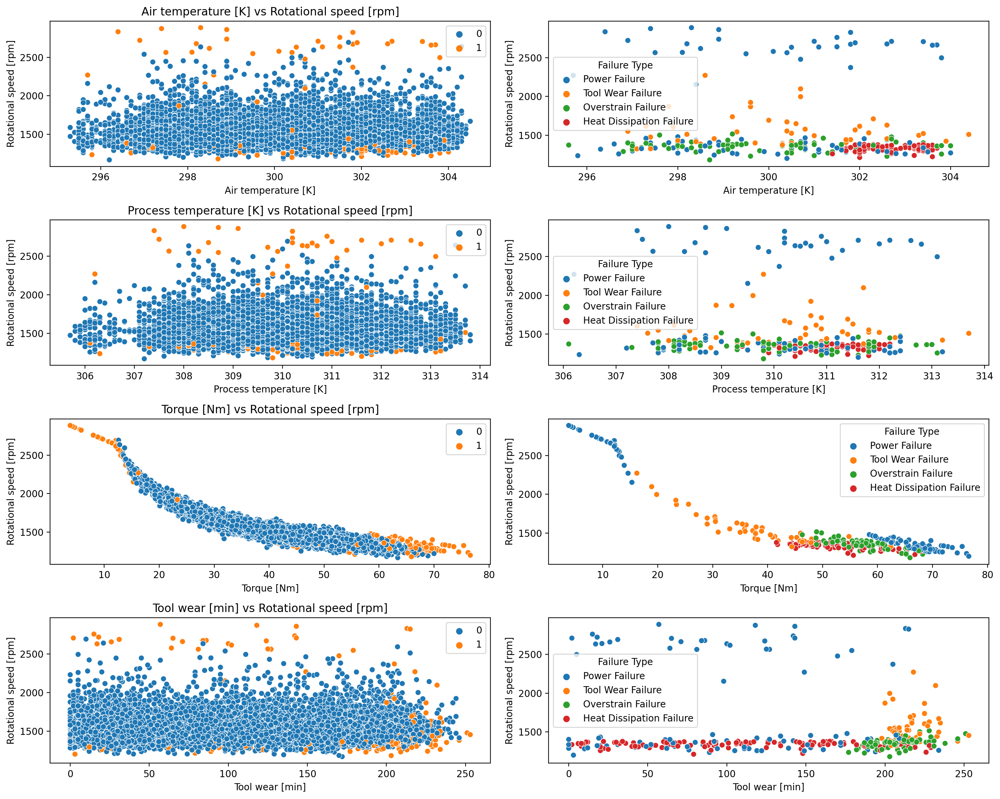

In [24]:
f,ax=plt.subplots(4,2,figsize=(15,12),dpi=200)
ls=['Air temperature [K]','Process temperature [K]','Torque [Nm]','Tool wear [min]']
ax=ax.flatten()
j=0
for i in range(0,len(ax),2):
    sns.scatterplot(data=df,x=ls[j],
                    y='Rotational speed [rpm]',
                    hue='Target',
                    ax=ax[i],
                    legend='full')
    sns.scatterplot(data=df[(df['Failure Type'] != "No Failure")],
                    x=ls[j],
                    y='Rotational speed [rpm]',
                    hue='Failure Type',
                    ax=ax[i+1],
                    legend='brief')
    ax[i].set_title(ls[j]+" vs Rotational speed [rpm]")
    ax[i].legend(loc='upper right')
    j+=1

plt.tight_layout()
plt.show()

The components manufactured with high torque and high or low rotational speed causes power failure in the components.
Overstrain failure occurs for components manufactured with low rotational speed and regardless of air or process temperature and few data data points indicates that there are power failure and tool wear failure as well and heat dissipation failure occurs for components manufactured with high air and process temperature and low rotational speed.

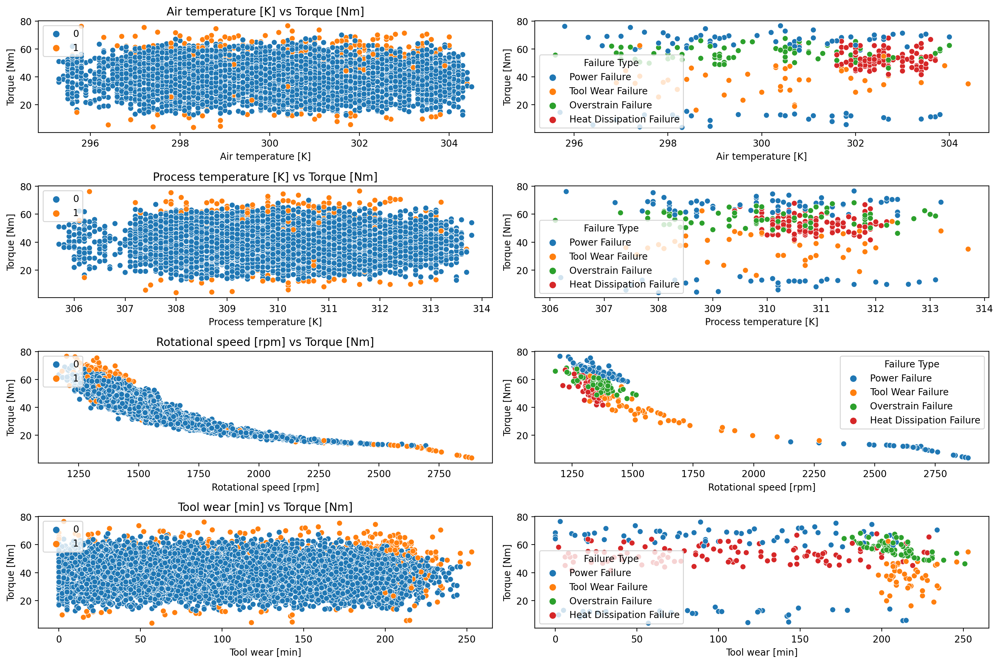

In [25]:
f,ax=plt.subplots(4,2,figsize=(15,10),dpi=200)
ls=['Air temperature [K]','Process temperature [K]','Rotational speed [rpm]','Tool wear [min]']
ax=ax.flatten()
j=0
for i in range(0,len(ax),2):
    sns.scatterplot(data=df,
                    x=ls[j],
                    y='Torque [Nm]',
                    hue='Target',
                    legend='full',
                    ax=ax[i])
    sns.scatterplot(data=df[(df['Failure Type'] != "No Failure")],
                    x=ls[j],
                    y='Torque [Nm]',
                    hue='Failure Type',
                    legend='brief',
                    ax=ax[i+1])
    ax[i].set_title(ls[j]+" vs Torque [Nm]")
    ax[i].legend(loc='upper left')
    j+=1

plt.tight_layout()
plt.show()

Components manufactured with high torque resulted in overstrain failure and power failure but with high torque and high air or process temperature there is a heat dissipation failure in components.Low torque components leads to power failure

## Multi variant analysis

In [27]:
ls=['Air temperature [K]','Process temperature [K]','Rotational speed [rpm]','Torque [Nm]','Tool wear [min]']

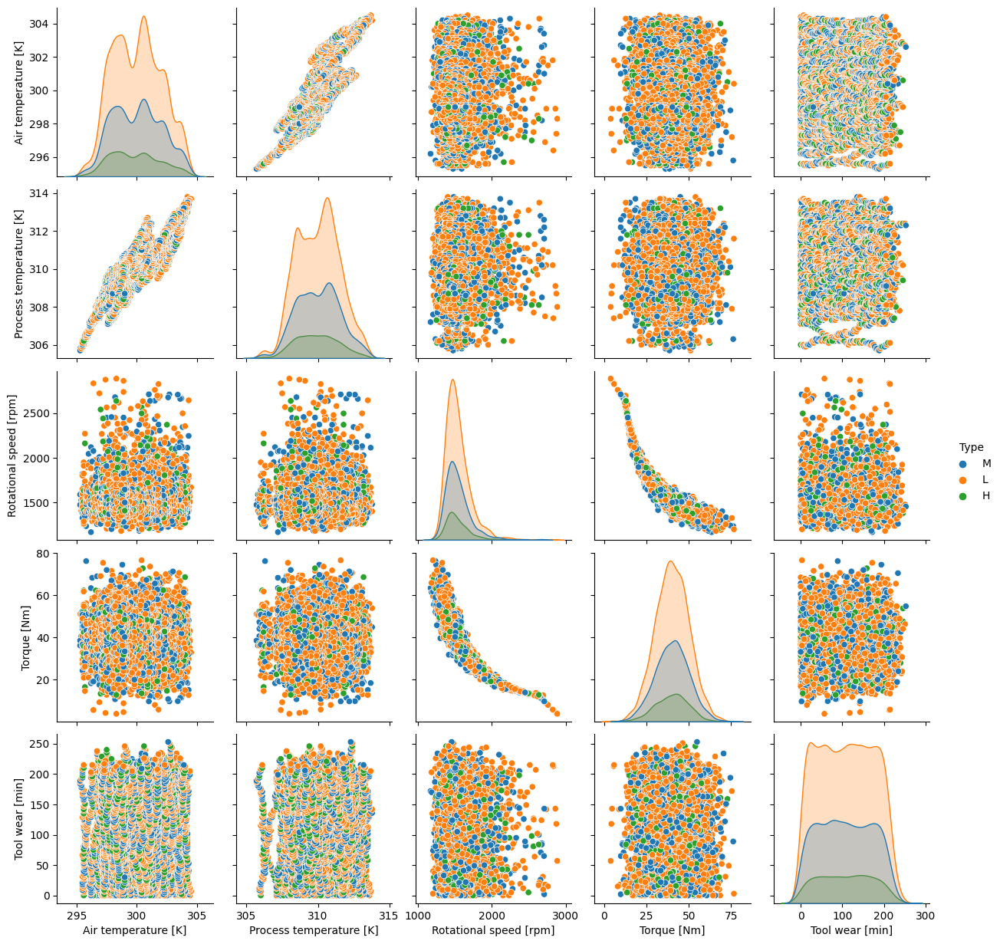

In [28]:
sns.pairplot(data=df,x_vars=ls,y_vars=ls,hue='Type')
plt.show()

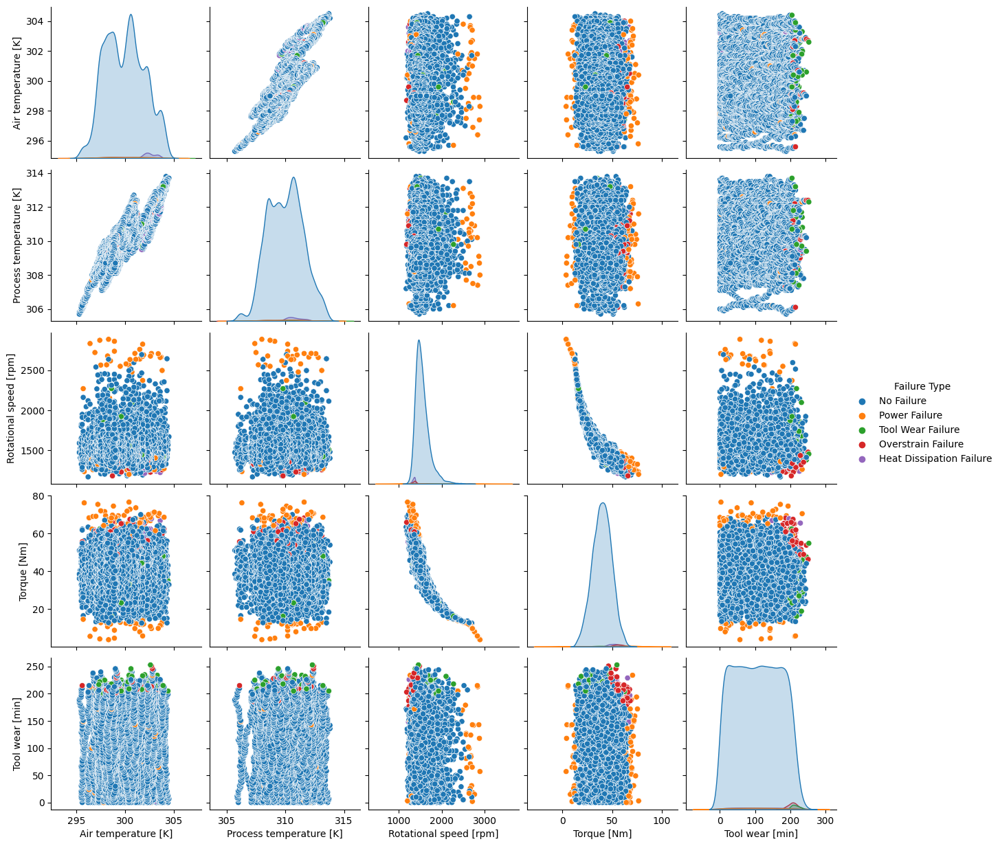

In [29]:
sns.pairplot(data=df,x_vars=ls,y_vars=ls,hue='Failure Type')
plt.show()

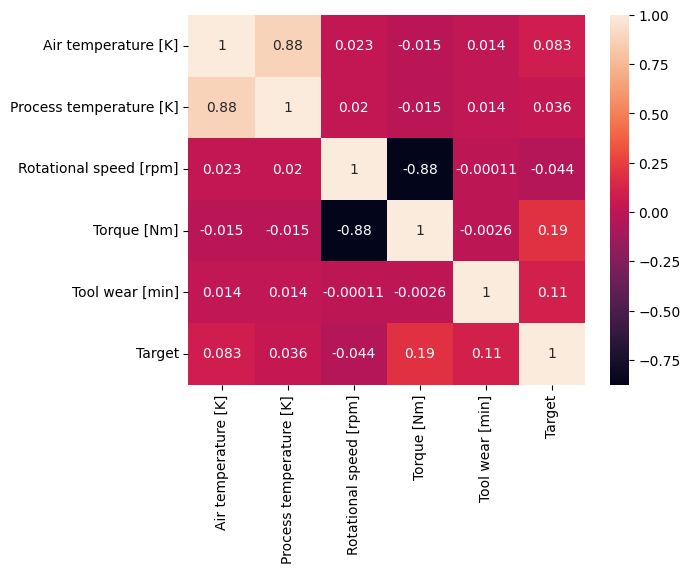

In [30]:
sns.heatmap(df.corr(),annot=True)
plt.show()

There seems to be positive high correlatio between air and process temperature and negative high correlation between torque and rotational speed. Usually anyone of the feature from each correlations would be picked

# Encoding Type and Failure Type columns

converting all columns to numerics for better prediction

In [31]:
df['Type']=df['Type'].map({'L':0,'M':1,'H':2})
df["Failure Type"]=df["Failure Type"].map({"No Failure" : 0,
                                           "Heat Dissipation Failure": 1,
                                           "Power Failure":2,
                                           "Overstrain Failure":3,
                                           "Tool Wear Failure":4
                                          })

In [32]:
df.head(3)

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,298.1,308.6,1551,42.8,0,0,0
1,0,298.2,308.7,1408,46.3,3,0,0
2,0,298.1,308.5,1498,49.4,5,0,0


# Binary classification

Building prediction model on target column

In [33]:
x=df.drop(columns=['Target','Failure Type'])
y=df['Target']

In [34]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=43)

In [35]:
# scaling the dataset
scaler=MinMaxScaler(feature_range=(-1, 1))
scaler.fit(x_train)
x_train_scaled=scaler.transform(x_train)
x_test_scaled=scaler.transform(x_test)

The features need to be scaled because all the features have different unit of measurement and few features have different ranges from other. Here I have used MinMax scaler as the features doesn't follow normally distribution

In [36]:
# Model selection
lr=LogisticRegression(class_weight='balanced')
dt=DecisionTreeClassifier(class_weight='balanced')
rf=RandomForestClassifier(class_weight='balanced')
ab=AdaBoostClassifier()
bg=BaggingClassifier()
gb=GradientBoostingClassifier() # scaling is important here

We are going to use above models to our datasets. We will train and test each model based on their f1 score due to the imbalance in the datasets. We will also perform Hyperparameter tuning on tree based models and we will finalize the best model the both targets

In [37]:
def cvscores(model,x_train,y_train,model_name):
    #model_name=str(model).split('(')[0]
    scoring=["precision_macro","recall_macro","f1_macro"]
    cv_score=cross_validate(model,x_train,y_train,cv=10,scoring=scoring)
    return pd.DataFrame({
        "model_name":[model_name],
        "precision_macro test score":[cv_score['test_precision_macro'].mean()],
        "recall_macro test score":[cv_score['test_recall_macro'].mean()],
        "f1_macro test score":[cv_score['test_f1_macro'].mean()]
        })

#confusion matrix function
def conf_matrix(test,pred,figsize=(3,3),dpi=100):
    if test.ndim == pred.ndim != 1:
        return print("cannot perform confusion matrix function, array is not 1-D")
    elif test.size != pred.size:
        return print ("input size doesn't match")
    else:
        import seaborn as sns
        plt.figure(figsize=figsize,dpi=dpi)
        sns.heatmap(pd.crosstab(index=test,columns=pred),annot=True,fmt='d',cbar=False,square=True)
        plt.xlabel("Predicated value")
        plt.ylabel("Actual value")
        return plt.show()

def accu_classifi_report_and_conf(model,x_train,x_test,y_train,y_test):
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    accuracy_report = accuracy_score(y_test,y_pred)
    classi_report = classification_report(y_test,y_pred)
    conf_matrix(test=y_test,pred=y_pred)
    print(f"accuracy_report : {accuracy_report}")
    print(f"classification_report:\n{classi_report}")


model_score, hypo_models_score, pipeline_score, pipeline_bc_scr, multi_cls_target_score, multi_class_hpo_models_score, pipeline_model_scr, scr

These are dataFrames created in this project code. It consists of precision macro average, recall macro average, f1 macro average score on training dataset, but the headers of the dataset will mention it as scores of testing dataset since we have used kfold cross validation on the training set. hence the above mentioned dataframes give you the average scores of training datasets only.

model_name:LogisticRegression


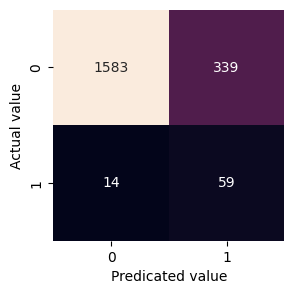

accuracy_report : 0.8230576441102757
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.82      0.90      1922
           1       0.15      0.81      0.25        73

    accuracy                           0.82      1995
   macro avg       0.57      0.82      0.58      1995
weighted avg       0.96      0.82      0.88      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:DecisionTreeClassifier


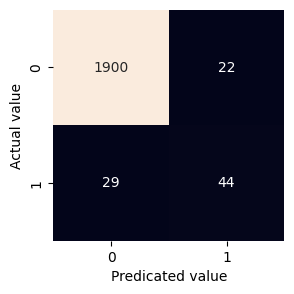

accuracy_report : 0.9744360902255639
classification_report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1922
           1       0.67      0.60      0.63        73

    accuracy                           0.97      1995
   macro avg       0.83      0.80      0.81      1995
weighted avg       0.97      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:RandomForestClassifier


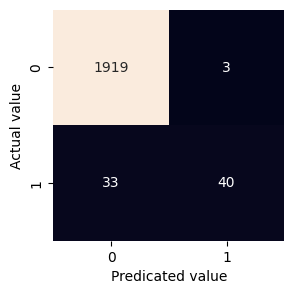

accuracy_report : 0.9819548872180451
classification_report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1922
           1       0.93      0.55      0.69        73

    accuracy                           0.98      1995
   macro avg       0.96      0.77      0.84      1995
weighted avg       0.98      0.98      0.98      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:AdaBoostClassifier


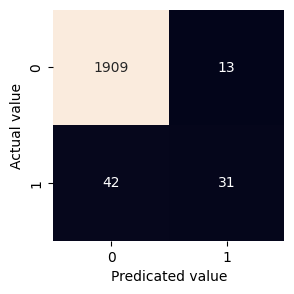

accuracy_report : 0.9724310776942355
classification_report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1922
           1       0.70      0.42      0.53        73

    accuracy                           0.97      1995
   macro avg       0.84      0.71      0.76      1995
weighted avg       0.97      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:BaggingClassifier


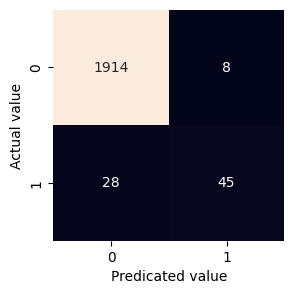

accuracy_report : 0.9819548872180451
classification_report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1922
           1       0.85      0.62      0.71        73

    accuracy                           0.98      1995
   macro avg       0.92      0.81      0.85      1995
weighted avg       0.98      0.98      0.98      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:GradientBoostingClassifier


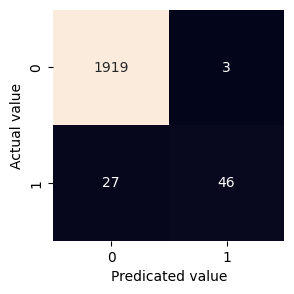

accuracy_report : 0.9849624060150376
classification_report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1922
           1       0.94      0.63      0.75        73

    accuracy                           0.98      1995
   macro avg       0.96      0.81      0.87      1995
weighted avg       0.98      0.98      0.98      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [38]:
model_score=pd.DataFrame()
for model in [lr,dt,rf,ab,bg,gb]:
    model_name=str(model).split('(')[0]
    print(f"model_name:{model_name}")
    model_score=model_score.append(cvscores(model,x_train_scaled,y_train,model_name=model_name))
    accu_classifi_report_and_conf(model,x_train_scaled,x_test_scaled,y_train,y_test)
    print('-<>-'*25)

In [39]:
model_score

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,LogisticRegression,0.565128,0.824101,0.569051
0,DecisionTreeClassifier,0.852859,0.807535,0.826980
0,RandomForestClassifier,0.951126,0.738672,0.809084
0,AdaBoostClassifier,0.804161,0.718993,0.753282
0,BaggingClassifier,0.934070,0.846393,0.883836
0,GradientBoostingClassifier,0.937195,0.805871,0.857538


The model_score table give you the macro average of precision score, recall score and f1 score of training dataset. Bagging classifier, Gradient Boosting and Decision Tree seems to be tha top 3 trained models with f1 macro average  score of 0.88, 0.85 and 0.82 respectively.

Let's look at the confusion matrix and classification report of the models. Since our objective is to predict failure class which Target 1. Logistic regression, Gradient Boosting and Bagging classifier seems to have high number of correct class 1 prediction of 59, 46 and 45 respectively but logistic regression seems to have low precision score od 0.15 which means the correct prediction of class 1 out of total predicted class 1 is low (59/(59+339)). This ultimately leads to low f1 score since f1 score is harmoic mean of precision and recall score. Hence we could conclude that gradient boosting performs better than other classification models above

Let's perform hyper parameter tuning on tree based models and check if we can boost the performance of any models.

### Hyper parameter optmization

In [40]:
lr=LogisticRegression(class_weight='balanced')
dt=DecisionTreeClassifier(class_weight='balanced')
rf=RandomForestClassifier(class_weight='balanced')
ab=AdaBoostClassifier()
bg=BaggingClassifier()
gb=GradientBoostingClassifier()

In [41]:
def dt_params():
    params={
        'class_weight': ['None','balanced'],
        'criterion': ['gini','entropy'],
        'max_features':['sqrt','log2','None'],
        'max_depth': [5,7,10]
    }
    return params
def rf_params():
    params={
        'bootstrap': [True,False],
        'class_weight':['None','balanced'],
        'criterion': ['gini','entropy'],
        'max_features':['sqrt','log2','None'],
        'max_depth': [5,7,10],
        'n_estimators':[100,250,500]
    }
    return params
def ab_params():
    params={
        'algorithm':['SAMME.R','SAMME'],
        'base_estimator': ['deprecated',lr,DecisionTreeClassifier()],
        'learning_rate': [1.0,0.5,0.01,0.2],
        'n_estimators': [50,250,500,750]
    }
    return params
def bg_params():
    params={
        'max_features': [4,5,6],
        'max_samples': [1,5,10],
        'n_estimators': [250,500,750],
        'base_estimator':[lr,DecisionTreeClassifier()]
    }
    return params
def gb_params():
    params={
        'n_estimators': [250,500,750],
        'max_features':['sqrt','log2','None'],
        'max_depth': [5,7,10]
    }
    return params

In [42]:
def rndcv(estimator,params):
    return RandomizedSearchCV(estimator=estimator,
                                       cv=10,n_iter=20,
                                       n_jobs=-1,random_state=84,
                                       param_distributions=params
                                      )

In [43]:
dt_hyper_param_tuning=rndcv(dt,dt_params())
rf_hyper_param_tuning=rndcv(rf,rf_params())
bg_hyper_param_tuning=rndcv(bg,bg_params())
gb_hyper_param_tuning=rndcv(gb,gb_params())
ab_hyper_param_tuning=rndcv(ab,ab_params())

In [44]:
#finding the best parameter
ls=[
    (dt,dt_hyper_param_tuning),
    (rf,rf_hyper_param_tuning),
    (ab,ab_hyper_param_tuning),
    (bg,bg_hyper_param_tuning),
    (gb,gb_hyper_param_tuning)
]

Model : DecisionTreeClassifier

Best parameter :
{'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'gini', 'class_weight': 'balanced'}
Time Taken 2.13



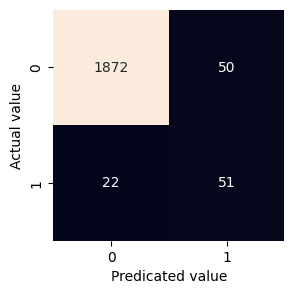

accuracy_report : 0.9639097744360903
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1922
           1       0.50      0.70      0.59        73

    accuracy                           0.96      1995
   macro avg       0.75      0.84      0.78      1995
weighted avg       0.97      0.96      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : RandomForestClassifier

Best parameter :
{'n_estimators': 100, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'entropy', 'class_weight': 'balanced', 'bootstrap': False}
Time Taken 93.37



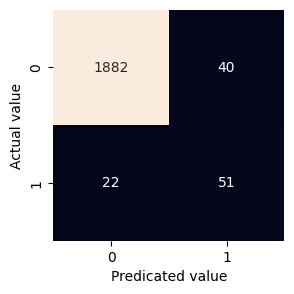

accuracy_report : 0.9689223057644111
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1922
           1       0.56      0.70      0.62        73

    accuracy                           0.97      1995
   macro avg       0.77      0.84      0.80      1995
weighted avg       0.97      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : AdaBoostClassifier

Best parameter :
{'n_estimators': 750, 'learning_rate': 1.0, 'base_estimator': DecisionTreeClassifier(), 'algorithm': 'SAMME.R'}
Time Taken 294.71



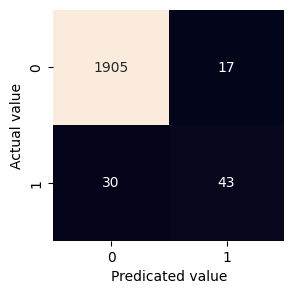

accuracy_report : 0.9764411027568922
classification_report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1922
           1       0.72      0.59      0.65        73

    accuracy                           0.98      1995
   macro avg       0.85      0.79      0.82      1995
weighted avg       0.97      0.98      0.98      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : BaggingClassifier

Best parameter :
{'n_estimators': 500, 'max_samples': 10, 'max_features': 5, 'base_estimator': DecisionTreeClassifier()}
Time Taken 830.23



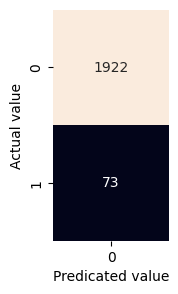

accuracy_report : 0.9634085213032582
classification_report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1922
           1       0.00      0.00      0.00        73

    accuracy                           0.96      1995
   macro avg       0.48      0.50      0.49      1995
weighted avg       0.93      0.96      0.95      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : GradientBoostingClassifier

Best parameter :
{'n_estimators': 500, 'max_features': 'sqrt', 'max_depth': 10}
Time Taken 461.00



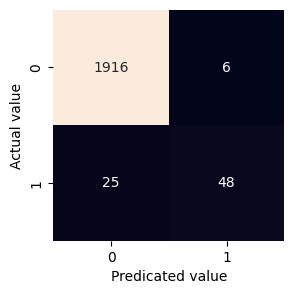

accuracy_report : 0.9844611528822055
classification_report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1922
           1       0.89      0.66      0.76        73

    accuracy                           0.98      1995
   macro avg       0.94      0.83      0.87      1995
weighted avg       0.98      0.98      0.98      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [45]:
hypo_models_score=pd.DataFrame()
for model,parameter in ls:
    print(f"Model : {str(model).split('(')[0]}\n")
    start=time.time()
    parameter.fit(x_train_scaled,y_train)
    print(f"Best parameter :\n{parameter.best_params_}")
    end=time.time()
    print("Time Taken %.2f\n"%(end-start))
    model.set_params(**parameter.best_params_)

    # cross-validation score
    hypo_models_score=hypo_models_score.append(cvscores(model,x_train_scaled,y_train,model_name=str(model).split('(')[0]))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(model,x_train_scaled,x_test_scaled,y_train,y_test)
    print('-<>-'*25)

In [46]:
hypo_models_score

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,DecisionTreeClassifier,0.679643,0.818706,0.723953
0,RandomForestClassifier,0.780336,0.847087,0.808980
0,AdaBoostClassifier,0.860604,0.845762,0.850500
0,BaggingClassifier,0.483893,0.500000,0.491815
0,GradientBoostingClassifier,0.940357,0.831126,0.875927


Performing Hyperparameter optimization on the tree models only reduced the preformance of most of the models except Adaboosting and gradient boosting. This only justifies that most of the parameters in the tree based models are used to counter overfitting in the models.

Though hyperparameter optimized adaboost model preformed (0.850500) considerably better than the previous non-tunned adaboost model(0.753282) on the train set, it didn't outperform the gradient boosting model(0.857538) but the hyperparameter optimized gradientboost seems to preform slightly better that the non-tunned gradientboosting model (0.875927). We could say the same on the test set as well.

## Handling imbalance in the dataset

In [47]:
# summarize class distribution
y_train.value_counts(normalize=True)*100

0    96.778641
1     3.221359
Name: Target, dtype: float64

In [48]:
lr=LogisticRegression(class_weight='balanced')
dt=DecisionTreeClassifier(class_weight='balanced')
rf=RandomForestClassifier(class_weight='balanced')
ab=AdaBoostClassifier()
bg=BaggingClassifier()
gb=GradientBoostingClassifier()

We are going to perfomer SMOTE technique to over sample the model. SMOTE creates syntetic instances by selecting one out of 5 K nearest minority class neighbours from a randomly selected minority class instance. The best way to use SMOTE is to over sample minority class and under sample majority class. I have used Random under sampling technique to undersample majority class

To know more about SMOTE technique kindly visit
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

We will also build a data pipline using imblearn pipeline as below design.

pipeline( scaling-> over sampling minority class-> under sampling majority class -> models )

In [50]:
# Synthetic Minority Oversampling technique and RandomUnderSampling technique
over_sampling=SMOTE(sampling_strategy=0.3,random_state=97)
under_sampling= RandomUnderSampler(sampling_strategy=0.5,random_state=74)

model_name:LogisticRegression


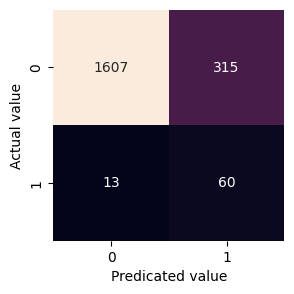

accuracy_report : 0.8355889724310777
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.84      0.91      1922
           1       0.16      0.82      0.27        73

    accuracy                           0.84      1995
   macro avg       0.58      0.83      0.59      1995
weighted avg       0.96      0.84      0.88      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:DecisionTreeClassifier


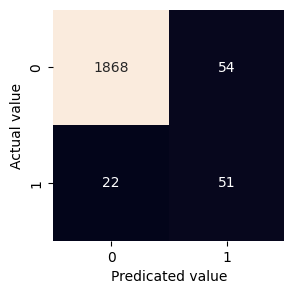

accuracy_report : 0.9619047619047619
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1922
           1       0.49      0.70      0.57        73

    accuracy                           0.96      1995
   macro avg       0.74      0.84      0.78      1995
weighted avg       0.97      0.96      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:RandomForestClassifier


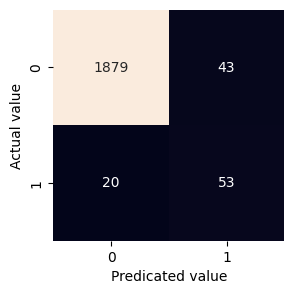

accuracy_report : 0.968421052631579
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1922
           1       0.55      0.73      0.63        73

    accuracy                           0.97      1995
   macro avg       0.77      0.85      0.81      1995
weighted avg       0.97      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:AdaBoostClassifier


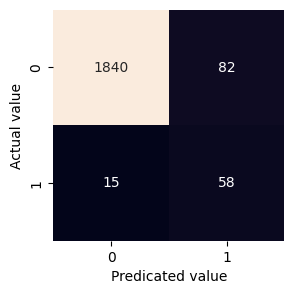

accuracy_report : 0.9513784461152882
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.97      1922
           1       0.41      0.79      0.54        73

    accuracy                           0.95      1995
   macro avg       0.70      0.88      0.76      1995
weighted avg       0.97      0.95      0.96      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:BaggingClassifier


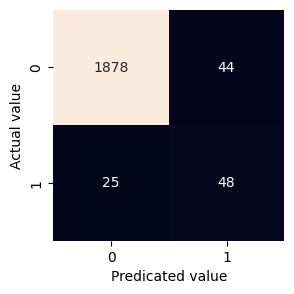

accuracy_report : 0.9654135338345865
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1922
           1       0.52      0.66      0.58        73

    accuracy                           0.97      1995
   macro avg       0.75      0.82      0.78      1995
weighted avg       0.97      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:GradientBoostingClassifier


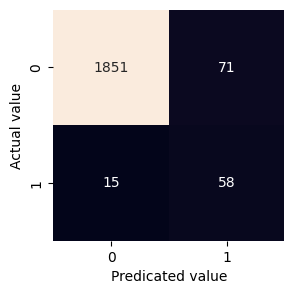

accuracy_report : 0.9568922305764411
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.98      1922
           1       0.45      0.79      0.57        73

    accuracy                           0.96      1995
   macro avg       0.72      0.88      0.78      1995
weighted avg       0.97      0.96      0.96      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [51]:
pipeline_score=pd.DataFrame()
for model in [lr,dt,rf,ab,bg,gb]:
    print(f"model_name:{str(model).split('(')[0]}")
    pipeline=Pipeline(steps=[('scaler',scaler),
                             ('over_sampling',over_sampling),
                             ('under_sampling',under_sampling),
                             ('model',model)]
                     )
    model_name=str(model).split('(')[0]
    # cross-validation score
    pipeline_score=pipeline_score.append(cvscores(pipeline,x_train,y_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(pipeline,x_train,x_test,y_train,y_test)
    print('-<>-'*25)

In [52]:
pipeline_score

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,LogisticRegression,0.567491,0.828951,0.574160
0,DecisionTreeClassifier,0.731587,0.872814,0.783164
0,RandomForestClassifier,0.765913,0.889254,0.813876
0,AdaBoostClassifier,0.672409,0.881059,0.729004
0,BaggingClassifier,0.760532,0.896388,0.812391
0,GradientBoostingClassifier,0.703961,0.920540,0.768159


### Hyperparameter optimization for sampled dateset

In [53]:
pipeline_dt=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',dt)]
                 )
pipeline_rf=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',rf)]
                 )
pipeline_ab=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',ab)]
                 )
pipeline_bg=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',bg)]
                 )
pipeline_gb=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',gb)]
                 )

In [54]:
def pipeline_dt_params():
    params={
        'model__class_weight': [None,'balanced'],
        'model__criterion': ['gini','entropy'],
        #'model__max_features':['sqrt','log2',None],
        'model__max_depth': [5,7,10]
    }
    return params
def pipeline_rf_params():
    params={
        'model__bootstrap': [True,False],
        'model__class_weight':[None,'balanced'],
        'model__criterion': ['gini','entropy'],
        'model__max_features':['sqrt','log2','None'],
        'model__max_depth': [5,7,10],
        'model__n_estimators':[100,250,500]
    }
    return params
def pipeline_ab_params():
    params={
        'model__algorithm':['SAMME.R','SAMME'],
        'model__base_estimator': ['deprecated',lr,DecisionTreeClassifier()],
        'model__learning_rate': [1.0,0.5,0.01,0.2],
        'model__n_estimators': [50,250,500,750]
    }
    return params
def pipeline_bg_params():
    params={
        'model__max_features': [4,5,6],
        'model__max_samples': [1,5,10],
        'model__n_estimators': [250,500,750],
        'model__base_estimator':[lr,DecisionTreeClassifier()]
    }
    return params
def pipeline_gb_params():
    params={
        'model__n_estimators': [250,500,750],
        'model__max_features':['sqrt','log2','None'],
        'model__max_depth': [5,7,10]
    }
    return params

In [55]:
dt_hyper_param_tuning=rndcv(pipeline_dt,pipeline_dt_params())
rf_hyper_param_tuning=rndcv(pipeline_rf,pipeline_rf_params())
bg_hyper_param_tuning=rndcv(pipeline_bg,pipeline_bg_params())
gb_hyper_param_tuning=rndcv(pipeline_gb,pipeline_gb_params())
ab_hyper_param_tuning=rndcv(pipeline_ab,pipeline_ab_params())

Model : DecisionTreeClassifier_pipeline_model

Best Parameter :
{'model__max_depth': 10, 'model__criterion': 'gini', 'model__class_weight': None}
Time Taken 4.81



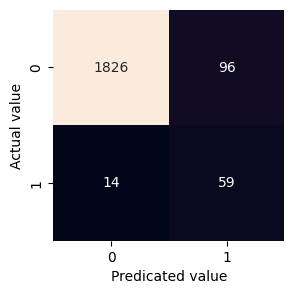

accuracy_report : 0.9448621553884712
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1922
           1       0.38      0.81      0.52        73

    accuracy                           0.94      1995
   macro avg       0.69      0.88      0.74      1995
weighted avg       0.97      0.94      0.95      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : RandomForestClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 500, 'model__max_features': 'log2', 'model__max_depth': 10, 'model__criterion': 'entropy', 'model__class_weight': None, 'model__bootstrap': True}
Time Taken 244.82



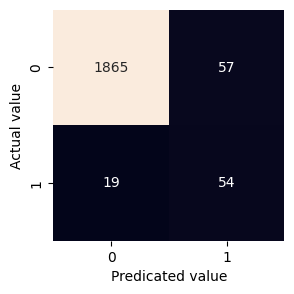

accuracy_report : 0.9619047619047619
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1922
           1       0.49      0.74      0.59        73

    accuracy                           0.96      1995
   macro avg       0.74      0.86      0.78      1995
weighted avg       0.97      0.96      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : AdaBoostClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 50, 'model__learning_rate': 1.0, 'model__base_estimator': DecisionTreeClassifier(), 'model__algorithm': 'SAMME.R'}
Time Taken 312.44



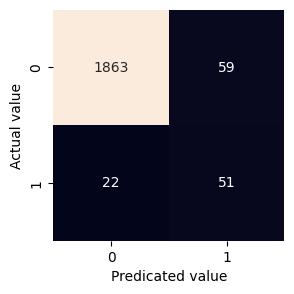

accuracy_report : 0.9593984962406015
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98      1922
           1       0.46      0.70      0.56        73

    accuracy                           0.96      1995
   macro avg       0.73      0.83      0.77      1995
weighted avg       0.97      0.96      0.96      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : BaggingClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 750, 'model__max_samples': 5, 'model__max_features': 4, 'model__base_estimator': LogisticRegression(class_weight='balanced')}
Time Taken 566.51



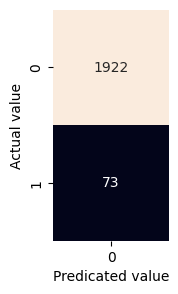

accuracy_report : 0.9634085213032582
classification_report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1922
           1       0.00      0.00      0.00        73

    accuracy                           0.96      1995
   macro avg       0.48      0.50      0.49      1995
weighted avg       0.93      0.96      0.95      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : GradientBoostingClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 750, 'model__max_features': 'sqrt', 'model__max_depth': 5}
Time Taken 601.90



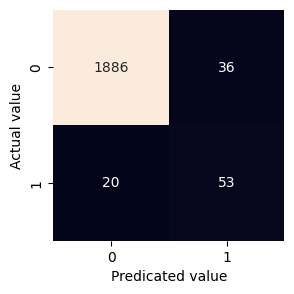

accuracy_report : 0.9719298245614035
classification_report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1922
           1       0.60      0.73      0.65        73

    accuracy                           0.97      1995
   macro avg       0.79      0.85      0.82      1995
weighted avg       0.98      0.97      0.97      1995

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [56]:
#finding the best parameter, their scores,accuracy,classification report,confusion matrix
ls=[
    (dt,pipeline_dt,dt_hyper_param_tuning),
    (rf,pipeline_rf,rf_hyper_param_tuning),
    (ab,pipeline_ab,ab_hyper_param_tuning),
    (bg,pipeline_bg,bg_hyper_param_tuning),
    (gb,pipeline_gb,gb_hyper_param_tuning)
]
pipeline_bc_scr=pd.DataFrame()
for model,pipeline_model,parameter in ls:
    model_name=str(model).split("(")[0]+"_pipeline_model"
    print(f"Model : {model_name}\n")
    start=time.time()
    parameter.fit(x_train,y_train)
    print(f"Best Parameter :\n{parameter.best_params_}")
    end=time.time()
    print("Time Taken %.2f\n"%(end-start))

    best_dt_params = parameter.best_params_
    pipeline_model.set_params(**best_dt_params)

    # cross-validation score
    pipeline_bc_scr=pipeline_bc_scr.append(cvscores(pipeline_model,x_train,y_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(pipeline_model,x_train,x_test,y_train,y_test)
    print('-<>-'*25)

In [57]:
pipeline_bc_scr

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,DecisionTreeClassifier_pipeline_model,0.727210,0.879287,0.780214
0,RandomForestClassifier_pipeline_model,0.738926,0.899283,0.795516
0,AdaBoostClassifier_pipeline_model,0.733785,0.865510,0.781893
0,BaggingClassifier_pipeline_model,0.600857,0.509510,0.509140
0,GradientBoostingClassifier_pipeline_model,0.807520,0.896350,0.844567


I have noticed that handling imbalance in the dataset dosen't improve performance on any of the model, infact most of the models have down performed. Hence we will use Gradient Boosting classifier without handling imbalance dataset with best parameters

{
  'n_estimators': 500,

  'max_features': 'sqrt',

  'max_depth': 10
  }

Since this gives us the f1 macro average score of 0.87 on both train set and test set and 0.76 f1 score on class 1. Although 0.76 is not the best score for failure class prediction this can be imporved by adding few parameters and values in gradient boosting while performing hyper parameter tuning. We also haven't used KNN, SVM, Naive Bayes models and few other classification models like LightGBM, XGBoost ect.. We could also use those models to check if we can improve preformance

we could use feature importance in order to find the most used features to get more insights but this project doesn't cover feature importance

# Multi-class classification

Building prediction model on Failure Type column

In [108]:
x=df[df['Target']==1].drop(columns=['Target','Failure Type'])
y2=df[df['Target']==1]['Failure Type']

Since all the 0th class in Target column is going to be 0 in failure type column, it's better to remove all the records of 0th class in Target column. Although this might lead to test and train with only 330 records in total.

In [109]:
x_train,x_test,y2_train,y2_test=train_test_split(x,y2,test_size=0.2,random_state=96)

In [110]:
# scaling the dataset scaler=MinMaxScaler(feature_range=(-1, 1))
scaler.fit(x_train)
x_train_scaled=scaler.transform(x_train)
x_test_scaled=scaler.transform(x_test)

In [111]:
lr=LogisticRegression(class_weight='balanced')
dt=DecisionTreeClassifier(class_weight='balanced')
rf=RandomForestClassifier(class_weight='balanced')
ab=AdaBoostClassifier()
bg=BaggingClassifier()
gb=GradientBoostingClassifier()

model_name:LogisticRegression


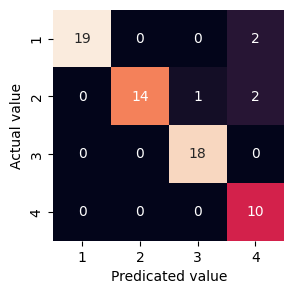

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       1.00      0.82      0.90        17
           3       0.95      1.00      0.97        18
           4       0.71      1.00      0.83        10

    accuracy                           0.92        66
   macro avg       0.92      0.93      0.91        66
weighted avg       0.94      0.92      0.93        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:DecisionTreeClassifier


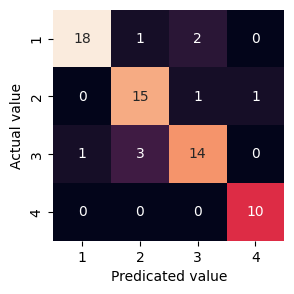

accuracy_report : 0.8636363636363636
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.86      0.90        21
           2       0.79      0.88      0.83        17
           3       0.82      0.78      0.80        18
           4       0.91      1.00      0.95        10

    accuracy                           0.86        66
   macro avg       0.87      0.88      0.87        66
weighted avg       0.87      0.86      0.86        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:RandomForestClassifier


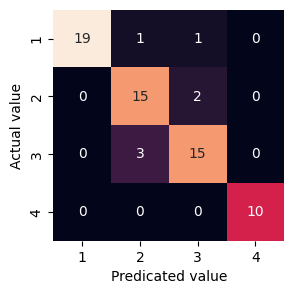

accuracy_report : 0.8939393939393939
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       0.79      0.88      0.83        17
           3       0.83      0.83      0.83        18
           4       1.00      1.00      1.00        10

    accuracy                           0.89        66
   macro avg       0.91      0.91      0.90        66
weighted avg       0.90      0.89      0.90        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:AdaBoostClassifier


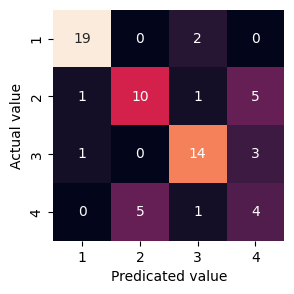

accuracy_report : 0.7121212121212122
classification_report:
              precision    recall  f1-score   support

           1       0.90      0.90      0.90        21
           2       0.67      0.59      0.62        17
           3       0.78      0.78      0.78        18
           4       0.33      0.40      0.36        10

    accuracy                           0.71        66
   macro avg       0.67      0.67      0.67        66
weighted avg       0.72      0.71      0.72        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:BaggingClassifier


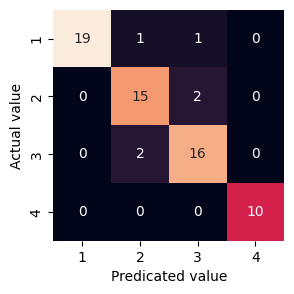

accuracy_report : 0.9090909090909091
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       0.83      0.88      0.86        17
           3       0.84      0.89      0.86        18
           4       1.00      1.00      1.00        10

    accuracy                           0.91        66
   macro avg       0.92      0.92      0.92        66
weighted avg       0.91      0.91      0.91        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:GradientBoostingClassifier


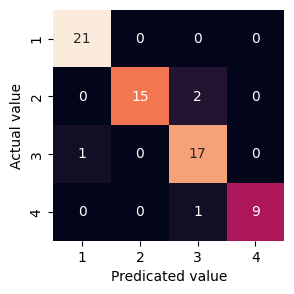

accuracy_report : 0.9393939393939394
classification_report:
              precision    recall  f1-score   support

           1       0.95      1.00      0.98        21
           2       1.00      0.88      0.94        17
           3       0.85      0.94      0.89        18
           4       1.00      0.90      0.95        10

    accuracy                           0.94        66
   macro avg       0.95      0.93      0.94        66
weighted avg       0.94      0.94      0.94        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,{LogisticRegression},0.861260,0.846329,0.834699
0,{DecisionTreeClassifier},0.874978,0.865873,0.862113
0,{RandomForestClassifier},0.926071,0.909375,0.909340
0,{AdaBoostClassifier},0.721951,0.724008,0.700796
0,{BaggingClassifier},0.890783,0.874206,0.868499
0,{GradientBoostingClassifier},0.930992,0.918056,0.915782


In [112]:
multi_cls_target_score=pd.DataFrame()
for model in [lr,dt,rf,ab,bg,gb]:
    model_name=str(model).split('(')[0]
    print(f"model_name:{model_name}")
    model_name={str(model).split('(')[0]}
    # cross-validation score
    multi_cls_target_score=multi_cls_target_score.append(cvscores(model,x_train_scaled,y2_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(model,x_train_scaled,x_test_scaled,y2_train,y2_test)
    print('-<>-'*25)
multi_cls_target_score

For the multiclass classification, I have used same models as binary class classification. Here by looking at f1_macro score on multi_cls_target_score dataframe, Gradient boosting, RandomForestClassifier and Bagging classifier performs better on train set (there is a mistake in the headers of the data frame). If we look at the classification report, there seems to be overfitting in gradient boosting and randomforest since class 1 and 4 have f1 score greater than 0.95. If we have to chose a best model, we could go for bagging classifier as it provides better stability in predicting the class compare to other models. Let's perform Hyper parameter optimization and try to counter the overfitting of the models

### Hyperparameter optmization

In [113]:
dt_hyper_param_tuning=rndcv(dt,dt_params())
rf_hyper_param_tuning=rndcv(rf,rf_params())
bg_hyper_param_tuning=rndcv(bg,bg_params())
gb_hyper_param_tuning=rndcv(gb,gb_params())
ab_hyper_param_tuning=rndcv(ab,ab_params())

In [114]:
ls=[
    (dt,dt_hyper_param_tuning),
    (rf,rf_hyper_param_tuning),
    (ab,ab_hyper_param_tuning),
    (bg,bg_hyper_param_tuning),
    (gb,gb_hyper_param_tuning)
]

Model : DecisionTreeClassifier

Best parameter :
{'max_features': 'sqrt', 'max_depth': 5, 'criterion': 'gini', 'class_weight': 'balanced'}
Time Taken 2.88



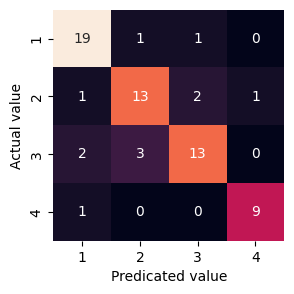

accuracy_report : 0.8181818181818182
classification_report:
              precision    recall  f1-score   support

           1       0.83      0.90      0.86        21
           2       0.76      0.76      0.76        17
           3       0.81      0.72      0.76        18
           4       0.90      0.90      0.90        10

    accuracy                           0.82        66
   macro avg       0.83      0.82      0.82        66
weighted avg       0.82      0.82      0.82        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : RandomForestClassifier

Best parameter :
{'n_estimators': 100, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'entropy', 'class_weight': 'balanced', 'bootstrap': False}
Time Taken 26.85



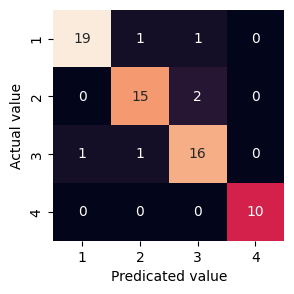

accuracy_report : 0.9090909090909091
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.90      0.93        21
           2       0.88      0.88      0.88        17
           3       0.84      0.89      0.86        18
           4       1.00      1.00      1.00        10

    accuracy                           0.91        66
   macro avg       0.92      0.92      0.92        66
weighted avg       0.91      0.91      0.91        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : AdaBoostClassifier

Best parameter :
{'n_estimators': 500, 'learning_rate': 1.0, 'base_estimator': DecisionTreeClassifier(), 'algorithm': 'SAMME'}
Time Taken 120.00



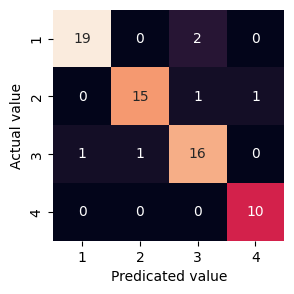

accuracy_report : 0.9090909090909091
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.90      0.93        21
           2       0.94      0.88      0.91        17
           3       0.84      0.89      0.86        18
           4       0.91      1.00      0.95        10

    accuracy                           0.91        66
   macro avg       0.91      0.92      0.91        66
weighted avg       0.91      0.91      0.91        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : BaggingClassifier

Best parameter :
{'n_estimators': 500, 'max_samples': 10, 'max_features': 5, 'base_estimator': DecisionTreeClassifier()}
Time Taken 439.20



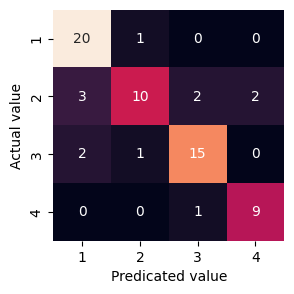

accuracy_report : 0.8181818181818182
classification_report:
              precision    recall  f1-score   support

           1       0.80      0.95      0.87        21
           2       0.83      0.59      0.69        17
           3       0.83      0.83      0.83        18
           4       0.82      0.90      0.86        10

    accuracy                           0.82        66
   macro avg       0.82      0.82      0.81        66
weighted avg       0.82      0.82      0.81        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : GradientBoostingClassifier

Best parameter :
{'n_estimators': 250, 'max_features': 'sqrt', 'max_depth': 10}
Time Taken 273.81



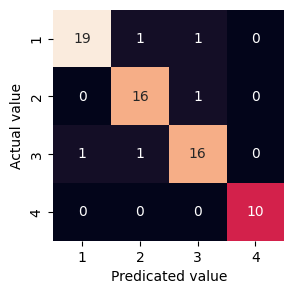

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.90      0.93        21
           2       0.89      0.94      0.91        17
           3       0.89      0.89      0.89        18
           4       1.00      1.00      1.00        10

    accuracy                           0.92        66
   macro avg       0.93      0.93      0.93        66
weighted avg       0.93      0.92      0.92        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [115]:
multi_class_hpo_models_score=pd.DataFrame()
for model,parameter in ls:
    model_name=str(model).split('(')[0]
    print(f"Model : {model_name}\n")
    start=time.time()
    parameter.fit(x_train_scaled,y2_train)
    print(f"Best parameter :\n{parameter.best_params_}")
    end=time.time()
    print("Time Taken %.2f\n"%(end-start))
    model.set_params(**parameter.best_params_)

    # cross-validation score
    multi_class_hpo_models_score=multi_class_hpo_models_score.append(cvscores(model,x_train_scaled,y2_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(model,x_train_scaled,x_test_scaled,y2_train,y2_test)
    print('-<>-'*25)

In [116]:
multi_class_hpo_models_score

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,DecisionTreeClassifier,0.810030,0.809177,0.795970
0,RandomForestClassifier,0.923224,0.909970,0.908613
0,AdaBoostClassifier,0.900405,0.888790,0.888031
0,BaggingClassifier,0.852394,0.764782,0.772997
0,GradientBoostingClassifier,0.930585,0.915526,0.915443


Although we were able to handle overfitting in RandomForestClassifier and gradient boosting classifier's class 1. Class 4 is still overfitted. Also we could notice that there is a considerable spike in perfromance of Ada boosting as it has performed better than bagging classifier after hyper parameter optimization. Let's handle the imbalance in the dataset and evaluate the performance and we will optmize the models with that balanced dataset and evaluate the performance

## Handling imbalance in the dataset

In [117]:
# summarize class distribution
y2_train.value_counts(normalize=True)*100

1    34.469697
2    29.545455
3    22.727273
4    13.257576
Name: Failure Type, dtype: float64

In [118]:
lr=LogisticRegression(class_weight='balanced')
dt=DecisionTreeClassifier(class_weight='balanced')
rf=RandomForestClassifier(class_weight='balanced')
ab=AdaBoostClassifier()
bg=BaggingClassifier()
gb=GradientBoostingClassifier()

In [119]:
over_sampling=SMOTE(sampling_strategy='auto',random_state=97)
under_sampling= RandomUnderSampler(sampling_strategy='auto',random_state=74)

We have used same SMOTE technique for over sampling minority class and Random under sampler for under sampling majority class

In [120]:
pipeline_lr=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',lr)]
                 )
pipeline_dt=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',dt)]
                 )
pipeline_rf=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',rf)]
                 )
pipeline_ab=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',ab)]
                 )
pipeline_bg=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',bg)]
                 )
pipeline_gb=Pipeline(steps=[('scaler',scaler),
                         ('over_sampling',over_sampling),
                         ('under_sampling',under_sampling),
                         ('model',gb)]
                 )

In [121]:
ls=[
    (lr,pipeline_lr,None),
    (dt,pipeline_dt,dt_hyper_param_tuning),
    (rf,pipeline_rf,rf_hyper_param_tuning),
    (ab,pipeline_ab,ab_hyper_param_tuning),
    (bg,pipeline_bg,bg_hyper_param_tuning),
    (gb,pipeline_gb,gb_hyper_param_tuning)
]

model_name:LogisticRegression_pipeline_model


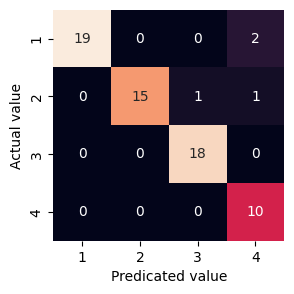

accuracy_report : 0.9393939393939394
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       1.00      0.88      0.94        17
           3       0.95      1.00      0.97        18
           4       0.77      1.00      0.87        10

    accuracy                           0.94        66
   macro avg       0.93      0.95      0.93        66
weighted avg       0.95      0.94      0.94        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:DecisionTreeClassifier_pipeline_model


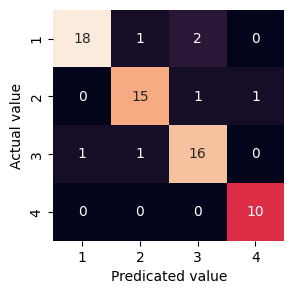

accuracy_report : 0.8939393939393939
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.86      0.90        21
           2       0.88      0.88      0.88        17
           3       0.84      0.89      0.86        18
           4       0.91      1.00      0.95        10

    accuracy                           0.89        66
   macro avg       0.90      0.91      0.90        66
weighted avg       0.90      0.89      0.89        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:RandomForestClassifier_pipeline_model


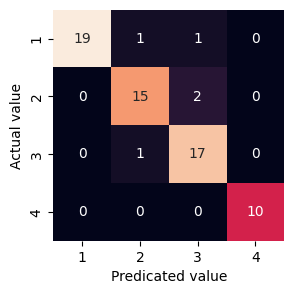

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       0.88      0.88      0.88        17
           3       0.85      0.94      0.89        18
           4       1.00      1.00      1.00        10

    accuracy                           0.92        66
   macro avg       0.93      0.93      0.93        66
weighted avg       0.93      0.92      0.93        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:AdaBoostClassifier_pipeline_model


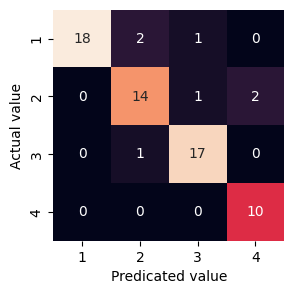

accuracy_report : 0.8939393939393939
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.86      0.92        21
           2       0.82      0.82      0.82        17
           3       0.89      0.94      0.92        18
           4       0.83      1.00      0.91        10

    accuracy                           0.89        66
   macro avg       0.89      0.91      0.89        66
weighted avg       0.90      0.89      0.89        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:BaggingClassifier_pipeline_model


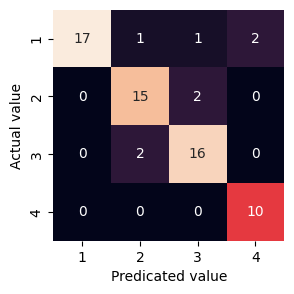

accuracy_report : 0.8787878787878788
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.81      0.89        21
           2       0.83      0.88      0.86        17
           3       0.84      0.89      0.86        18
           4       0.83      1.00      0.91        10

    accuracy                           0.88        66
   macro avg       0.88      0.90      0.88        66
weighted avg       0.89      0.88      0.88        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
model_name:GradientBoostingClassifier_pipeline_model


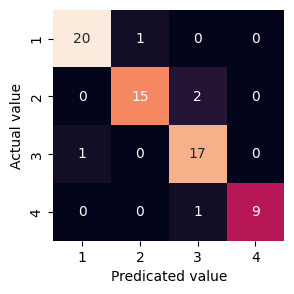

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.95      0.95        21
           2       0.94      0.88      0.91        17
           3       0.85      0.94      0.89        18
           4       1.00      0.90      0.95        10

    accuracy                           0.92        66
   macro avg       0.93      0.92      0.93        66
weighted avg       0.93      0.92      0.92        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [122]:
pipeline_model_scr=pd.DataFrame()
for model,pipeline_model,_ in ls:
    model_name=str(model).split("(")[0]+"_pipeline_model"
    print(f"model_name:{model_name}")

    # cross-validation score
    pipeline_model_scr=pipeline_model_scr.append(cvscores(pipeline_model,x_train,y2_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(pipeline_model,x_train,x_test,y2_train,y2_test)
    print('-<>-'*25)

In [123]:
pipeline_model_scr

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,LogisticRegression_pipeline_model,0.873230,0.868651,0.854685
0,DecisionTreeClassifier_pipeline_model,0.890831,0.879067,0.871730
0,RandomForestClassifier_pipeline_model,0.910794,0.898165,0.893874
0,AdaBoostClassifier_pipeline_model,0.787201,0.785020,0.769543
0,BaggingClassifier_pipeline_model,0.900129,0.889484,0.882960
0,GradientBoostingClassifier_pipeline_model,0.920327,0.908929,0.905229


By lookig at the above dataframe, the F1 macro average of Gradient boosting, Randomforest and bagging seems to be high for the train set. If we look at the classification report, Decision tree doesn't seem to have any overfitting problem compare to other classifiers mentiond. Even ada boost seems to produce same accuracy are Decision tree but the macro average of decision tree seems to be higher than Adaboost. Let's optmize the above models and try to get better performance without overfitting

### Hyperparameter Optmization for sampled dataset

In [124]:
dt_hyper_param_tuning=rndcv(pipeline_dt,pipeline_dt_params())
rf_hyper_param_tuning=rndcv(pipeline_rf,pipeline_rf_params())
bg_hyper_param_tuning=rndcv(pipeline_bg,pipeline_bg_params())
gb_hyper_param_tuning=rndcv(pipeline_gb,pipeline_gb_params())
ab_hyper_param_tuning=rndcv(pipeline_ab,pipeline_ab_params())

Model : DecisionTreeClassifier_pipeline_model

Best Parameter :
{'model__max_depth': 10, 'model__criterion': 'entropy', 'model__class_weight': None}
Time Taken 1.31



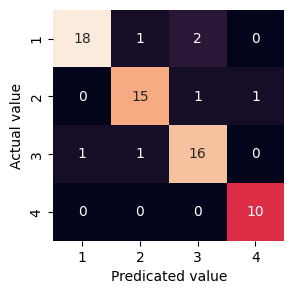

accuracy_report : 0.8939393939393939
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.86      0.90        21
           2       0.88      0.88      0.88        17
           3       0.84      0.89      0.86        18
           4       0.91      1.00      0.95        10

    accuracy                           0.89        66
   macro avg       0.90      0.91      0.90        66
weighted avg       0.90      0.89      0.89        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : RandomForestClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 500, 'model__max_features': 'log2', 'model__max_depth': 5, 'model__criterion': 'gini', 'model__class_weight': 'balanced', 'model__bootstrap': True}
Time Taken 56.75



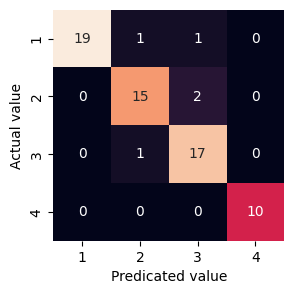

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       1.00      0.90      0.95        21
           2       0.88      0.88      0.88        17
           3       0.85      0.94      0.89        18
           4       1.00      1.00      1.00        10

    accuracy                           0.92        66
   macro avg       0.93      0.93      0.93        66
weighted avg       0.93      0.92      0.93        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : AdaBoostClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 500, 'model__learning_rate': 0.5, 'model__base_estimator': DecisionTreeClassifier(), 'model__algorithm': 'SAMME'}
Time Taken 136.03



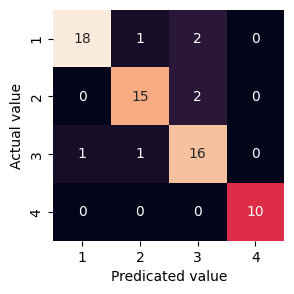

accuracy_report : 0.8939393939393939
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.86      0.90        21
           2       0.88      0.88      0.88        17
           3       0.80      0.89      0.84        18
           4       1.00      1.00      1.00        10

    accuracy                           0.89        66
   macro avg       0.91      0.91      0.91        66
weighted avg       0.90      0.89      0.89        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : BaggingClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 750, 'model__max_samples': 10, 'model__max_features': 4, 'model__base_estimator': DecisionTreeClassifier()}
Time Taken 414.73



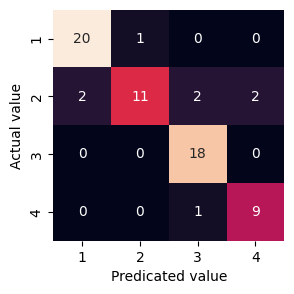

accuracy_report : 0.8787878787878788
classification_report:
              precision    recall  f1-score   support

           1       0.91      0.95      0.93        21
           2       0.92      0.65      0.76        17
           3       0.86      1.00      0.92        18
           4       0.82      0.90      0.86        10

    accuracy                           0.88        66
   macro avg       0.88      0.87      0.87        66
weighted avg       0.88      0.88      0.87        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-
Model : GradientBoostingClassifier_pipeline_model

Best Parameter :
{'model__n_estimators': 500, 'model__max_features': 'log2', 'model__max_depth': 10}
Time Taken 371.44



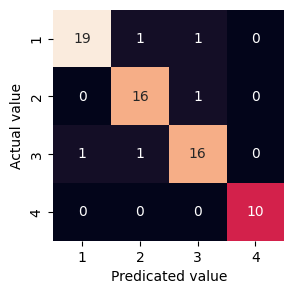

accuracy_report : 0.9242424242424242
classification_report:
              precision    recall  f1-score   support

           1       0.95      0.90      0.93        21
           2       0.89      0.94      0.91        17
           3       0.89      0.89      0.89        18
           4       1.00      1.00      1.00        10

    accuracy                           0.92        66
   macro avg       0.93      0.93      0.93        66
weighted avg       0.93      0.92      0.92        66

-<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>--<>-


In [125]:
#finding the best parameter
ls=[
    (dt,pipeline_dt,dt_hyper_param_tuning),
    (rf,pipeline_rf,rf_hyper_param_tuning),
    (ab,pipeline_ab,ab_hyper_param_tuning),
    (bg,pipeline_bg,bg_hyper_param_tuning),
    (gb,pipeline_gb,gb_hyper_param_tuning)
]
scr=pd.DataFrame()
for model,pipeline_model,parameter in ls:
    model_name=str(model).split('(')[0]+"_pipeline_model"
    print(f"Model : {model_name}\n")
    start=time.time()
    parameter.fit(x_train,y2_train)
    print(f"Best Parameter :\n{parameter.best_params_}")
    end=time.time()
    print("Time Taken %.2f\n"%(end-start))
    #pipeline_model.set_params(**parameter.best_params_)

    best_params = parameter.best_params_
    pipeline_model.set_params(**best_params)


    # cross-validation score
    scr=scr.append(cvscores(pipeline_model,x_train,y2_train,model_name=model_name))
    # accuracy,classification report,confusion matrix
    accu_classifi_report_and_conf(pipeline_model,x_train,x_test,y2_train,y2_test)
    print('-<>-'*25)


In [126]:
scr

,model_name,precision_macro test score,recall_macro test score,f1_macro test score
0,DecisionTreeClassifier_pipeline_model,0.886217,0.870040,0.864574
0,RandomForestClassifier_pipeline_model,0.913056,0.899206,0.895170
0,AdaBoostClassifier_pipeline_model,0.883500,0.872123,0.863283
0,BaggingClassifier_pipeline_model,0.845693,0.823313,0.814394
0,GradientBoostingClassifier_pipeline_model,0.930268,0.917609,0.915976


From the above models we have trained and tested for multiclass classification, Decision Tree with Parameter

{
  
  'model__max_depth': 10,
  
  'model__criterion': 'entropy',
  
  'model__class_weight': None
  
  }

seems to perform better without overfitting on target classes and producing test accuracy of 0.89.

Since we have used only 330 records in the mutliclass classification the information we have fed to the models were limited, by feeding more information we could also improve the stability and performance of the model.